<a href="https://colab.research.google.com/github/arpanbiswas52/example-models/blob/master/FEToyModel_GPexplore.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

GP expore using GPy/BoTorch packages-- Toy model on 1st and 2nd order ferroelectric.

**Model Equation**

Equation 1: $Energy = a(T-Tc){P}^2 + b{P}^4 -EP$

Equation 2: $Energy = a(T-Tc){P}^2 + b{P}^4 + c{P}^6 -EP$

The goal is to explore the paramter space (a, b, c) based on the Polarization (P) at the equilibrium state. 

**Note**- The GP can throw error as singular matrix for computing Cholesky decomposition even after adding jitter = $1e-6$. This is an ongoing issue in BoTorch. We can get around this by trying with different seeds in choosing random samples. Will provide if any better fix found later.

In [6]:
!pip install botorch
!pip install gpytorch
!pip install smt

     |████████████████████████████████| 256kB 9.0MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 51kB 4.9MB/s 
  Created wheel for smt: filename=smt-1.0.0-cp37-cp37m-linux_x86_64.whl size=522056 sha256=457367231d3161c7df26610971c27874810628bbd3ec8dca2e8abc893b3eae45
  Stored in directory: /root/.cache/pip/wheels/ae/5c/ba/c8992e9141ecfe86ad641a72ae1a0184514e5a1e8cabb0d7e3
Successfully built smt
  Created wheel for pyDOE2: filename=pyDOE2-1.3.0-cp37-none-any.whl size=25519 sha256=48b6f50f7a76baee2b6d1e42828f36259b09124361d3ba78b0d7294c4fff9060
  Stored in directory: /root/.cache/pip/wheels/60/88/1d/b334ee00dd83e82d111ec56c3be91573d335c93870698037f1
Successfully built pyDOE2


In [7]:
#Importing packages
import torch as to
from botorch.models import SingleTaskGP
from botorch.fit import fit_gpytorch_model
from botorch.models.gpytorch import GPyTorchModel
from botorch.utils import standardize
from gpytorch.distributions import MultivariateNormal
from gpytorch.kernels import ScaleKernel, RBFKernel
from gpytorch.likelihoods import GaussianLikelihood
from gpytorch.means import ConstantMean
from gpytorch.mlls import ExactMarginalLogLikelihood
from botorch.acquisition import UpperConfidenceBound
from botorch.optim import optimize_acqf
from botorch.acquisition import qExpectedImprovement
from botorch.acquisition import ExpectedImprovement
from botorch.sampling import IIDNormalSampler
from botorch.sampling import SobolQMCNormalSampler
from gpytorch.likelihoods.likelihood import Likelihood
import matplotlib.pyplot as plt
import numpy as np
import random

from gpytorch.models import ExactGP


from mpl_toolkits.axes_grid1 import make_axes_locatable
from smt.sampling_methods import LHS
import pandas as pd
import seaborn as sns; sns.set(style="ticks", color_codes=True)
import sympy as sym

In [8]:
#Define Custom GP model
class SimpleCustomGP(ExactGP, GPyTorchModel):
    _num_outputs = 1  # to inform GPyTorchModel API

    def __init__(self, train_X, train_Y):
        # squeeze output dim before passing train_Y to ExactGP
        super().__init__(train_X, train_Y.squeeze(-1), GaussianLikelihood())
        self.mean_module = ConstantMean()
        self.covar_module = ScaleKernel(
            base_kernel=RBFKernel(ard_num_dims=train_X.shape[-1]),
        )
        self.to(train_X)  # make sure we're on the right device/dtype

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return MultivariateNormal(mean_x, covar_x)

In [14]:
# Toy model: Equation 1
def toymod1(a, b, T, Tc, E):
    P = sym.Symbol('P')
    En = a*(T-Tc)*(P**2) + b*(P**4) - E*P
    dEn_dP = sym.diff(En)
    solP = sym.solve(dEn_dP,P)
    Pol = solP[2]
    return Pol

# Toy model: Equation 2
def toymod2(a, b, c, T, Tc, E):
    P = sym.Symbol('P')
    En = a*(T-Tc)*(P**2) + b*(P**4) +c*(P**6) - E*P
    dEn_dP = sym.diff(En)
    solP = sym.solve(dEn_dP,P)
    Pol = solP[2]
    return Pol

# Acquistion function: Full exploration only
def acq_fullexplore(var):

    y_pred_vars = var
    y_pred_vars_mean = np.mean(y_pred_vars, axis=1)
    acq_cand = np.argmax(y_pred_vars_mean)
    acq_val= np.max(y_pred_vars_mean)

    return  acq_cand, acq_val


#Plot functions of results
def plot_exploration_results3D(x_grid, x_explore, y_pred_means, y_explore, y_pred_vars, i):
    #1st plot
    fig, axs = plt.subplots(nrows = 3, ncols = 1, figsize = (7,7))
    #fig, ((axs1, axs2), (axs3, axs4)) = plt.subplots(2, 2)
    axs[0].axs1 = plt.axes(projection='3d')
    #axs[0, 0].axs1.plot3D(x_explore[:,0], x_explore[:,1], y_explore[:,0], 'blue')
    axs[0].axs1.scatter3D(x_explore[:,0], x_explore[:,1], y_explore, c=y_explore, cmap='viridis')
    axs[0].axs1.set_title('a vs b vs true_P at iter =' + str(i))
    plt.show()
    axs[1].axs2 = plt.axes(projection='3d')
    axs[1].axs2.scatter(x_grid[:,0], x_grid[:,1], y_pred_means, cmap='viridis', linewidth=0.2)
    axs[1].axs2.plot_trisurf(x_grid[:,0], x_grid[:,1], y_pred_means[:, 0], cmap='viridis', edgecolor='none')
    axs[1].axs2.set_title('a vs b vs GP_P_up at iter =' + str(i))
    plt.show()

    axs[2].axs2 = plt.axes(projection='3d')
    axs[2].axs2.scatter(x_grid[:,0], x_grid[:,1], y_pred_vars, cmap='viridis', linewidth=0.2)
    axs[2].axs2.plot_trisurf(x_grid[:,0], x_grid[:,1], y_pred_vars[:, 0], cmap='viridis', edgecolor='none')
    axs[2].axs2.set_title('a vs b vs uncertainity_P_up at iter =' + str(i))
    plt.show()
    fig.tight_layout()

    fig1, ax = plt.subplots(nrows=3, ncols=1, figsize=(7, 7))

    ax[0].scatter(x_explore[:,0], x_explore[:,1], c=y_explore, cmap='viridis', linewidth=0.2)
    ax[0].set_title('a vs b vs true_P at iter =' + str(i))
    ax[1].scatter(x_grid[:, 0], x_grid[:, 1], c=y_pred_means, cmap='viridis', linewidth=0.2)
    ax[1].set_title('a vs b vs GP_P at iter =' + str(i))
    ax[2].scatter(x_grid[:, 0], x_grid[:, 1], y_pred_vars, cmap='viridis', linewidth=0.2)
    ax[2].set_title('a vs b vs uncertainity_P at iter =' + str(i))
    fig.tight_layout()
    plt.show()

**Toy model Equation 1** 

-- Analysis

Feasible domain space a=(0.01, 5) and b =(0.01, 2)


In [15]:
#Initializing Paramters
E=0
T0 = 300
Tc = 400 # Curie Temperature
n_grid = 2500
xlimits = np.array([[0.01, 5], [0.01, 2]]) # Also try with ranges for a,b as (0.01, 10),(0.01, 2)
sampling = LHS(xlimits=xlimits)
np.random.seed(1000)
x_grid = sampling(n_grid) # Generating 2500 samples from LHS sampling
num = 30 #Starting samples
N= 200 #Maximum evaluations
np.random.seed(100)
#Initilize with 30 randomly training samples using Latin Hypercube sampling
train_X = sampling(num) 
train_Y = np.zeros(num)

# Find the P values at equilibrium state for the toy models at the starting samples.
# If the P value is no real, the domain is infeasible and the GP will be unstable in this case. To detect such infeasible domain while running the GP, any non-real P values will be tweaked to a very large value.
# This will help us to detect any infeasible domain space with abnormal P values.
# In this example, we considered toy model 1
for i in range(0, num):

    Pol = toymod1(train_X[i,0], train_X[i,1], T0,Tc, E)
    #Pol = toymod2(a=-1, b=train_X[i,0], c=train_X[i,1], T=T0,Tc=Tc, E=E)
    #if (Pol**2<0):
    #    Pol = 10e10
    if (Pol.is_real== False):
         Pol = 10e10
    train_Y[i] = Pol

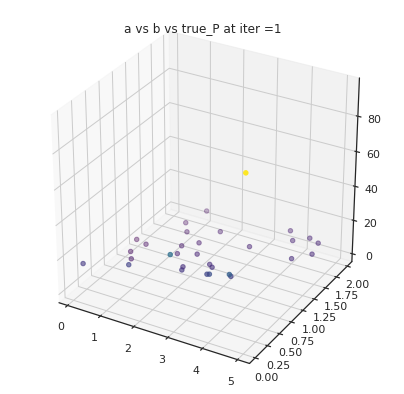

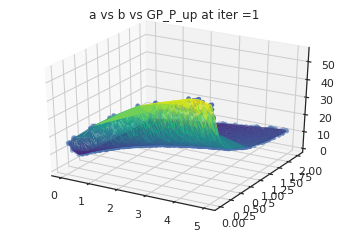

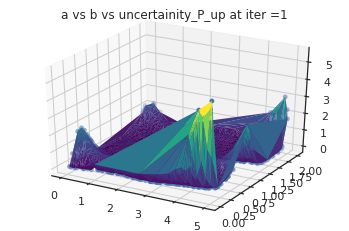

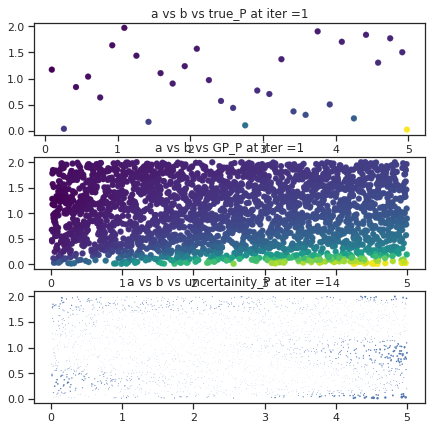

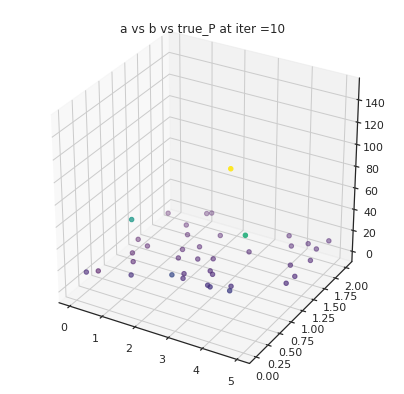

...

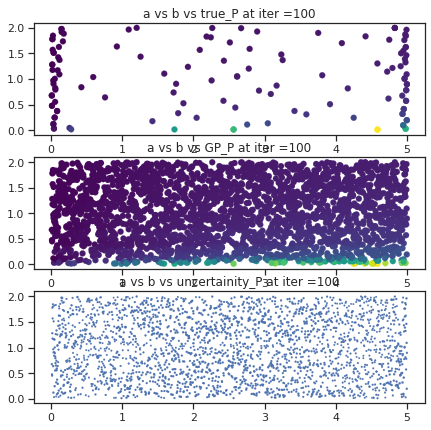

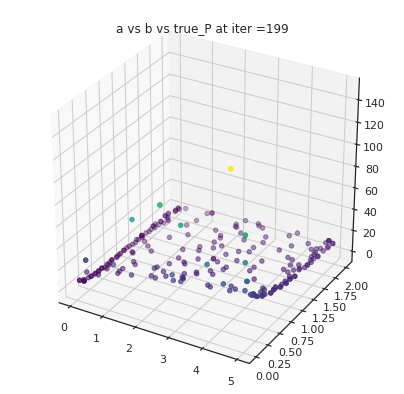

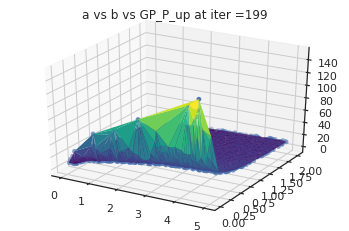

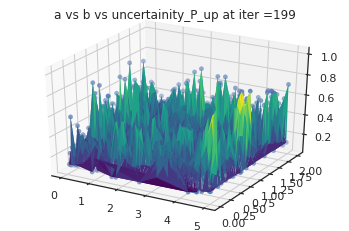

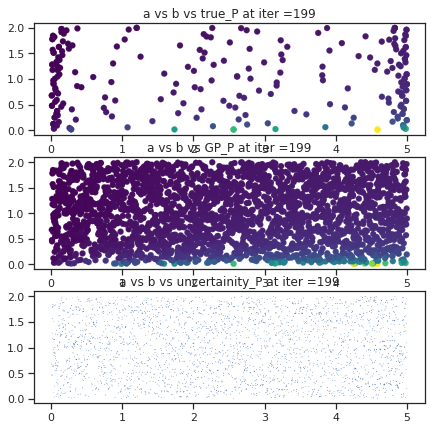

0.9975003155705053
5.43579609045338


In [16]:
# Run GP exploration

train_X = to.from_numpy(train_X)
train_Y = to.from_numpy(train_Y)
train_y = to.empty(train_Y.__len__(),1)
train_y[:,0] = train_Y
train_y_fvar = to.empty(train_y.__len__(),1)
train_y_fvar[:,0]=1e-2
test_X = to.from_numpy(x_grid)

# Gp model fit
gp_ferro_toy = SimpleCustomGP(train_X, train_y)
mll = ExactMarginalLogLikelihood(gp_ferro_toy.likelihood, gp_ferro_toy)
fit_gpytorch_model(mll)


for i in range(1, N):
    ## Evaluating the posterior means and variances of the non-sampled lattice sites
    y_pred_toy = gp_ferro_toy.posterior(test_X)
    y_pred_means = y_pred_toy.mean
    y_pred_means = y_pred_means.detach().numpy()
    y_pred_means=np.reshape(y_pred_means,(test_X.__len__(),1))
    y_pred_vars = y_pred_toy.variance
    y_pred_vars = y_pred_vars.detach().numpy()
    y_pred_vars=np.reshape(y_pred_vars,(test_X.__len__(),1))
    acq_cand = np.argmax(y_pred_vars) # Considering only uncertainity from GP -- full exploration
    acq_val = np.max(y_pred_vars)
    ind = acq_cand
    val = acq_val


    if (i==1):
        val_ini = val
#Check for convergence
    if ((val)<=0.0001): # Stop for negligible expected improvement
        print("Model converged due to sufficient reduction of uncertainty over search space ")
        break
    else:
        # Find the true P values of next X, augment to the training dataset
        nextX = to.empty(1, 2)
        next_feval = to.empty(1, 1)
        nextX[0,:] = test_X[ind]

        Pol = toymod1(x_grid[ind, 0], x_grid[ind, 1], T0, Tc, E)
        #Pol = toymod2(a=-1, b=x_grid[ind, 0], c=x_grid[ind, 1], T=T0, Tc=Tc, E=E)

        if (Pol.is_real == False):
            Pol = 10e10
        P=np.zeros(1)
        P[0]=Pol
        P = to.from_numpy(P)
        next_feval[:,0] = P
        train_X = to.cat((train_X, nextX),0)
        train_y = to.cat((train_y, next_feval),0)
        train_y_fvar = to.empty(train_y.__len__(), 1)
        train_y_fvar[:, 0] = 1e-2

        # Updating GP model, conditioning on new data
        gp_ferro_toy = SimpleCustomGP(train_X, train_y)
        mll = ExactMarginalLogLikelihood(gp_ferro_toy.likelihood, gp_ferro_toy)
        fit_gpytorch_model(mll)


        if (i==1 or i==10 or i== 30 or i==50 or i==70 or i==100):
            t_x = train_X
            t_x = t_x.detach().numpy()
            #t_x = np.reshape(t_x, (train_X.__len__(), 4))
            t_x = np.reshape(t_x, (train_X.__len__(), 2))
            t_y = train_y
            t_y = t_y.detach().numpy()
            t_y = np.reshape(t_y, (train_X.__len__(), 1))

            plot_exploration_results3D(x_grid, t_x, y_pred_means, t_y, y_pred_vars, i)


P_pred_conv = y_pred_means
P_var_cov = y_pred_vars
# Plots
t_x = train_X
t_x = t_x.detach().numpy()
t_x = np.reshape(t_x, (train_X.__len__(), 2))
t_y = train_y
t_y = t_y.detach().numpy()
t_y = np.reshape(t_y, (train_X.__len__(), 1))

plot_exploration_results3D(x_grid, t_x, P_pred_conv, t_y, y_pred_vars, i)

if (i==N):
    print("Max. sampling reached, model stopped")
print(val)
print(val_ini)

**Domain space contains infeasible sub-space**

Lets try with similar analysis with choosing different ranges of paramters a, b as a =(-2, 2) and b =(0.01, 5)

In [17]:
#Initializing Paramters
E=0
T0 = 300
Tc = 400 # Curie Temperature
n_grid = 2500
xlimits = np.array([[-2, 2], [0.01, 5]]) # Also try with ranges for a,b as (-5, -0.01),(-2, 2); for domain with multiple infeasible sub-domain try with a,b as (-2, 2),(-2, 2)
sampling = LHS(xlimits=xlimits)
np.random.seed(1000)
x_grid = sampling(n_grid) # Generating 2500 samples from LHS sampling
num = 30 #Starting samples
N= 200 #Maximum evaluations
np.random.seed(100)
#Initilize with 30 randomly training samples using Latin Hypercube sampling
train_X = sampling(num) 
train_Y = np.zeros(num)

# Find the P values at equilibrium state for the toy models at the starting samples.
# If the P value is no real, the domain is infeasible and the GP will be unstable in this case. To detect such infeasible domain while running the GP, any non-real P values will be tweaked to a very large value.
# This will help us to detect any infeasible domain space with abnormal P values.
# In this example, we considered toy model 1
for i in range(0, num):

    Pol = toymod1(train_X[i,0], train_X[i,1], T0,Tc, E)
    #Pol = toymod2(a=-1, b=train_X[i,0], c=train_X[i,1], T=T0,Tc=Tc, E=E)
    #if (Pol**2<0):
    #    Pol = 10e10
    if (Pol.is_real== False):
         Pol = 10e10
    train_Y[i] = Pol

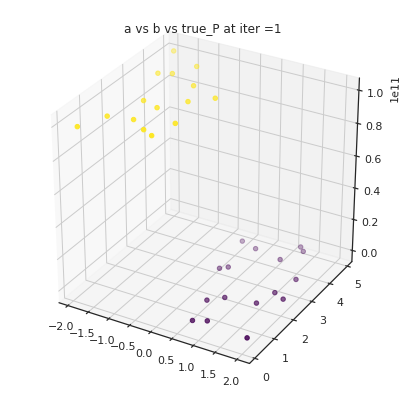

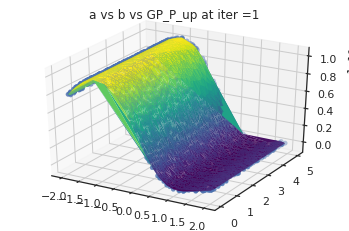

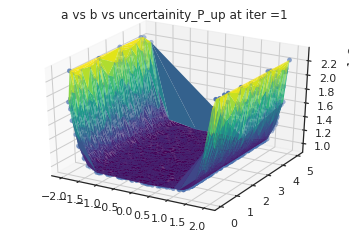

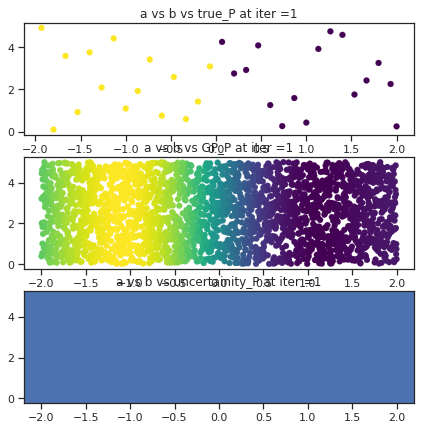

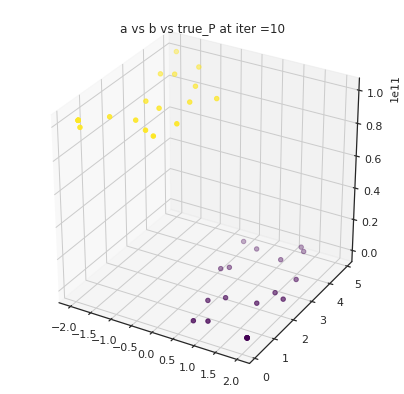

...

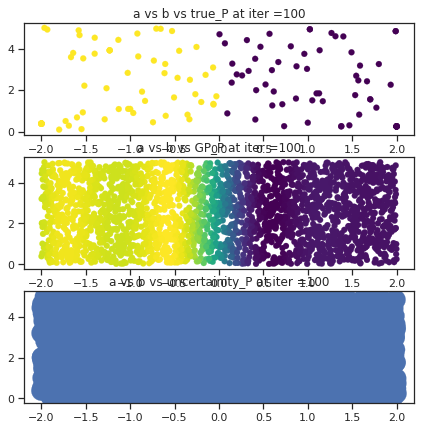

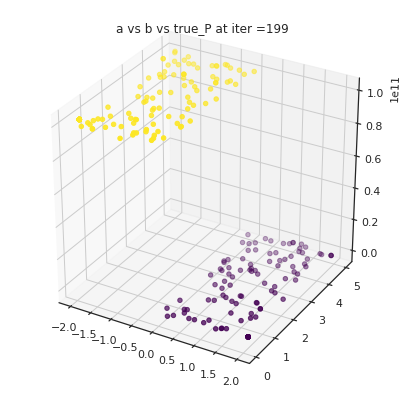

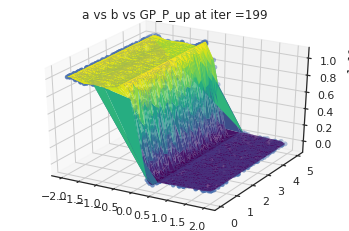

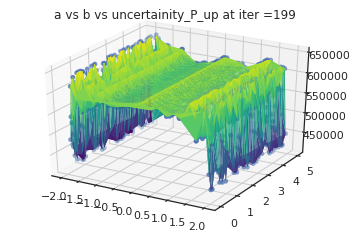

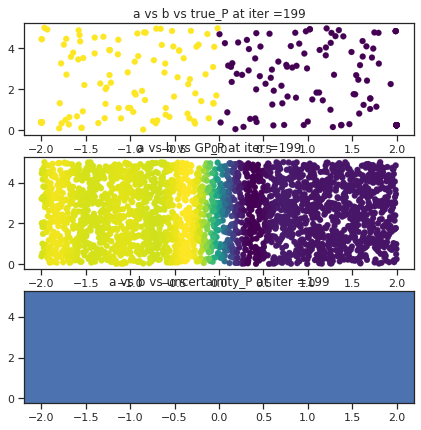

644986.0248426441
228921045.40226495


In [18]:
# Run GP exploration

train_X = to.from_numpy(train_X)
train_Y = to.from_numpy(train_Y)
train_y = to.empty(train_Y.__len__(),1)
train_y[:,0] = train_Y
train_y_fvar = to.empty(train_y.__len__(),1)
train_y_fvar[:,0]=1e-2
test_X = to.from_numpy(x_grid)

# Gp model fit
gp_ferro_toy = SimpleCustomGP(train_X, train_y)
mll = ExactMarginalLogLikelihood(gp_ferro_toy.likelihood, gp_ferro_toy)
fit_gpytorch_model(mll)


for i in range(1, N):
    ## Evaluating the posterior means and variances of the non-sampled lattice sites
    y_pred_toy = gp_ferro_toy.posterior(test_X)
    y_pred_means = y_pred_toy.mean
    y_pred_means = y_pred_means.detach().numpy()
    y_pred_means=np.reshape(y_pred_means,(test_X.__len__(),1))
    y_pred_vars = y_pred_toy.variance
    y_pred_vars = y_pred_vars.detach().numpy()
    y_pred_vars=np.reshape(y_pred_vars,(test_X.__len__(),1))
    acq_cand = np.argmax(y_pred_vars) # Considering only uncertainity from GP -- full exploration
    acq_val = np.max(y_pred_vars)
    ind = acq_cand
    val = acq_val


    if (i==1):
        val_ini = val
#Check for convergence
    if ((val)<=0.0001): # Stop for negligible expected improvement
        print("Model converged due to sufficient reduction of uncertainty over search space ")
        break
    else:
        # Find the true P values of next X, augment to the training dataset
        nextX = to.empty(1, 2)
        next_feval = to.empty(1, 1)
        nextX[0,:] = test_X[ind]

        Pol = toymod1(x_grid[ind, 0], x_grid[ind, 1], T0, Tc, E)
        #Pol = toymod2(a=-1, b=x_grid[ind, 0], c=x_grid[ind, 1], T=T0, Tc=Tc, E=E)

        if (Pol.is_real == False):
            Pol = 10e10
        P=np.zeros(1)
        P[0]=Pol
        P = to.from_numpy(P)
        next_feval[:,0] = P
        train_X = to.cat((train_X, nextX),0)
        train_y = to.cat((train_y, next_feval),0)
        train_y_fvar = to.empty(train_y.__len__(), 1)
        train_y_fvar[:, 0] = 1e-2

        # Updating GP model, conditioning on new data
        gp_ferro_toy = SimpleCustomGP(train_X, train_y)
        mll = ExactMarginalLogLikelihood(gp_ferro_toy.likelihood, gp_ferro_toy)
        fit_gpytorch_model(mll)


        if (i==1 or i==10 or i== 30 or i==50 or i==70 or i==100):
            t_x = train_X
            t_x = t_x.detach().numpy()
            #t_x = np.reshape(t_x, (train_X.__len__(), 4))
            t_x = np.reshape(t_x, (train_X.__len__(), 2))
            t_y = train_y
            t_y = t_y.detach().numpy()
            t_y = np.reshape(t_y, (train_X.__len__(), 1))

            plot_exploration_results3D(x_grid, t_x, y_pred_means, t_y, y_pred_vars, i)


P_pred_conv = y_pred_means
P_var_cov = y_pred_vars
# Plots
t_x = train_X
t_x = t_x.detach().numpy()
t_x = np.reshape(t_x, (train_X.__len__(), 2))
t_y = train_y
t_y = t_y.detach().numpy()
t_y = np.reshape(t_y, (train_X.__len__(), 1))

plot_exploration_results3D(x_grid, t_x, P_pred_conv, t_y, y_pred_vars, i)

if (i==N):
    print("Max. sampling reached, model stopped")
print(val)
print(val_ini)

**Toy model Equation 2** 

-- Analysis

Feasible domain space
a= 1; b= (-5, -0.01); c=(0.01, 2)

In [19]:
#Initializing Paramters
E=0
T0 = 300
Tc = 400 # Curie Temperature
n_grid = 2500
xlimits = np.array([[-5, -0.01], [0.01, 2]]) 
sampling = LHS(xlimits=xlimits)
np.random.seed(1000)
x_grid = sampling(n_grid) # Generating 2500 samples from LHS sampling
num = 30 #Starting samples
N= 200 #Maximum evaluations
np.random.seed(100)
#Initilize with 30 randomly training samples using Latin Hypercube sampling
train_X = sampling(num) 
train_Y = np.zeros(num)

# Find the P values at equilibrium state for the toy models at the starting samples.
# If the P value is no real, the domain is infeasible and the GP will be unstable in this case. To detect such infeasible domain while running the GP, any non-real P values will be tweaked to a very large value.
# This will help us to detect any infeasible domain space with abnormal P values.
# In this example, we considered toy model 1
for i in range(0, num):

    #Pol = toymod1(train_X[i,0], train_X[i,1], T0,Tc, E)
    Pol = toymod2(a=1, b=train_X[i,0], c=train_X[i,1], T=T0,Tc=Tc, E=E)
    #if (Pol**2<0):
    #    Pol = 10e10
    if (Pol.is_real== False):
         Pol = 10e10
    train_Y[i] = Pol

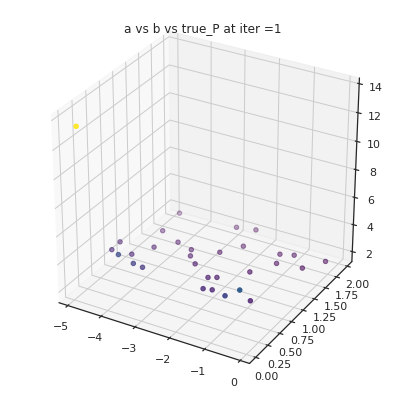

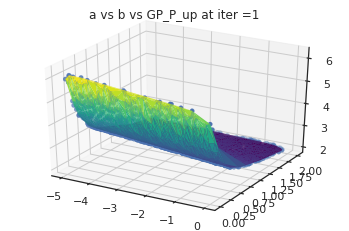

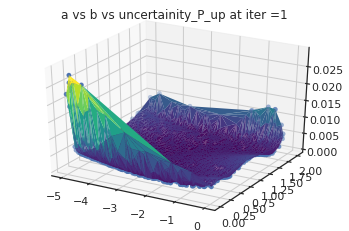

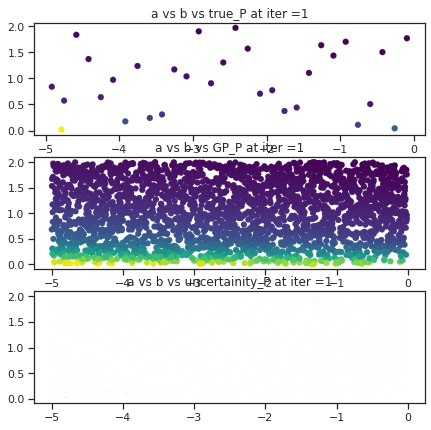

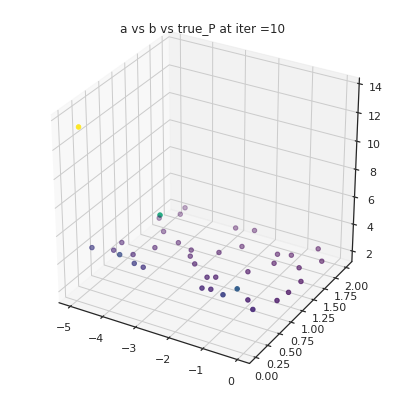

...

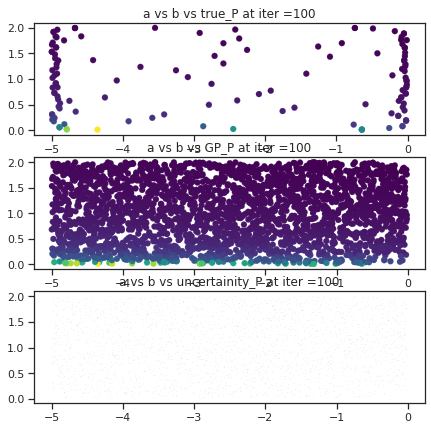

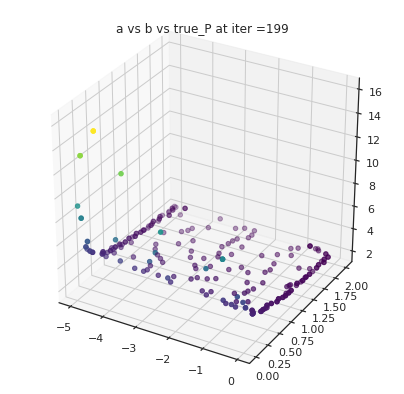

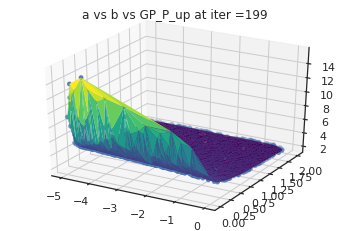

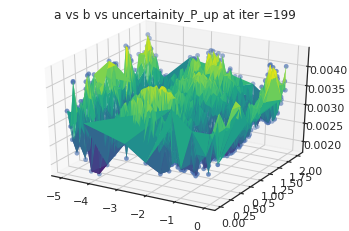

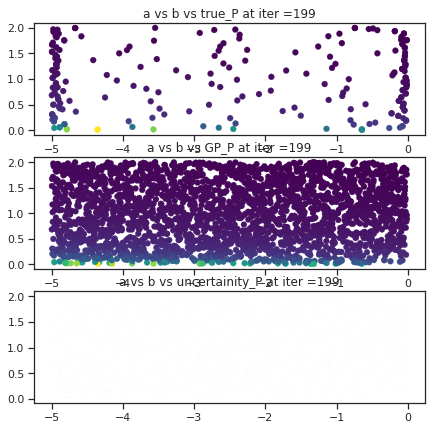

0.004309588138312392
0.028556600235297935


In [20]:
# Run GP exploration

train_X = to.from_numpy(train_X)
train_Y = to.from_numpy(train_Y)
train_y = to.empty(train_Y.__len__(),1)
train_y[:,0] = train_Y
train_y_fvar = to.empty(train_y.__len__(),1)
train_y_fvar[:,0]=1e-2
test_X = to.from_numpy(x_grid)

# Gp model fit
gp_ferro_toy = SimpleCustomGP(train_X, train_y)
mll = ExactMarginalLogLikelihood(gp_ferro_toy.likelihood, gp_ferro_toy)
fit_gpytorch_model(mll)


for i in range(1, N):
    ## Evaluating the posterior means and variances of the non-sampled lattice sites
    y_pred_toy = gp_ferro_toy.posterior(test_X)
    y_pred_means = y_pred_toy.mean
    y_pred_means = y_pred_means.detach().numpy()
    y_pred_means=np.reshape(y_pred_means,(test_X.__len__(),1))
    y_pred_vars = y_pred_toy.variance
    y_pred_vars = y_pred_vars.detach().numpy()
    y_pred_vars=np.reshape(y_pred_vars,(test_X.__len__(),1))
    acq_cand = np.argmax(y_pred_vars) # Considering only uncertainity from GP -- full exploration
    acq_val = np.max(y_pred_vars)
    ind = acq_cand
    val = acq_val


    if (i==1):
        val_ini = val
#Check for convergence
    if ((val)<=0.0001): # Stop for negligible expected improvement
        print("Model converged due to sufficient reduction of uncertainty over search space ")
        break
    else:
        # Find the true P values of next X, augment to the training dataset
        nextX = to.empty(1, 2)
        next_feval = to.empty(1, 1)
        nextX[0,:] = test_X[ind]

        #Pol = toymod1(x_grid[ind, 0], x_grid[ind, 1], T0, Tc, E)
        Pol = toymod2(a=1, b=x_grid[ind, 0], c=x_grid[ind, 1], T=T0, Tc=Tc, E=E)

        if (Pol.is_real == False):
            Pol = 10e10
        P=np.zeros(1)
        P[0]=Pol
        P = to.from_numpy(P)
        next_feval[:,0] = P
        train_X = to.cat((train_X, nextX),0)
        train_y = to.cat((train_y, next_feval),0)
        train_y_fvar = to.empty(train_y.__len__(), 1)
        train_y_fvar[:, 0] = 1e-2

        # Updating GP model, conditioning on new data
        gp_ferro_toy = SimpleCustomGP(train_X, train_y)
        mll = ExactMarginalLogLikelihood(gp_ferro_toy.likelihood, gp_ferro_toy)
        fit_gpytorch_model(mll)


        if (i==1 or i==10 or i== 30 or i==50 or i==70 or i==100):
            t_x = train_X
            t_x = t_x.detach().numpy()
            #t_x = np.reshape(t_x, (train_X.__len__(), 4))
            t_x = np.reshape(t_x, (train_X.__len__(), 2))
            t_y = train_y
            t_y = t_y.detach().numpy()
            t_y = np.reshape(t_y, (train_X.__len__(), 1))

            plot_exploration_results3D(x_grid, t_x, y_pred_means, t_y, y_pred_vars, i)


P_pred_conv = y_pred_means
P_var_cov = y_pred_vars
# Plots
t_x = train_X
t_x = t_x.detach().numpy()
t_x = np.reshape(t_x, (train_X.__len__(), 2))
t_y = train_y
t_y = t_y.detach().numpy()
t_y = np.reshape(t_y, (train_X.__len__(), 1))

plot_exploration_results3D(x_grid, t_x, P_pred_conv, t_y, y_pred_vars, i)

if (i==N):
    print("Max. sampling reached, model stopped")
print(val)
print(val_ini)

Domain space with infeasible sub-domain a= 1; b= (-5, -0.01); c=(-2, 2)

In [23]:
#Initializing Paramters
E=0
T0 = 300
Tc = 400 # Curie Temperature
n_grid = 2500
xlimits = np.array([[-5, -0.01], [-2, 2]]) # Also try with ranges for a=-1,b and c as (-5, -0.01),(-2, 2)
sampling = LHS(xlimits=xlimits)
np.random.seed(10)
x_grid = sampling(n_grid) # Generating 2500 samples from LHS sampling
num = 30 #Starting samples
N= 200 #Maximum evaluations
np.random.seed(100)
#Initilize with 30 randomly training samples using Latin Hypercube sampling
train_X = sampling(num) 
train_Y = np.zeros(num)

# Find the P values at equilibrium state for the toy models at the starting samples.
# If the P value is no real, the domain is infeasible and the GP will be unstable in this case. To detect such infeasible domain while running the GP, any non-real P values will be tweaked to a very large value.
# This will help us to detect any infeasible domain space with abnormal P values.
# In this example, we considered toy model 1
for i in range(0, num):

    #Pol = toymod1(train_X[i,0], train_X[i,1], T0,Tc, E)
    Pol = toymod2(a=1, b=train_X[i,0], c=train_X[i,1], T=T0,Tc=Tc, E=E)
    #if (Pol**2<0):
    #    Pol = 10e10
    if (Pol.is_real== False):
         Pol = 10e10
    train_Y[i] = Pol

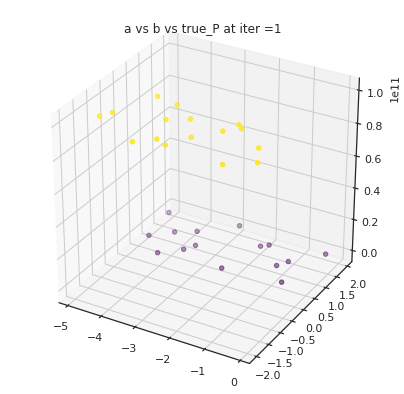

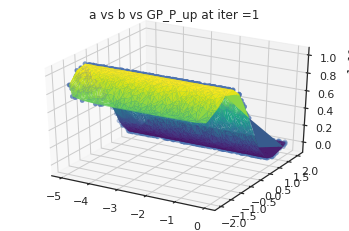

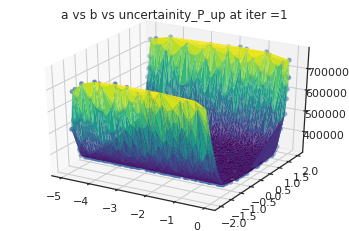

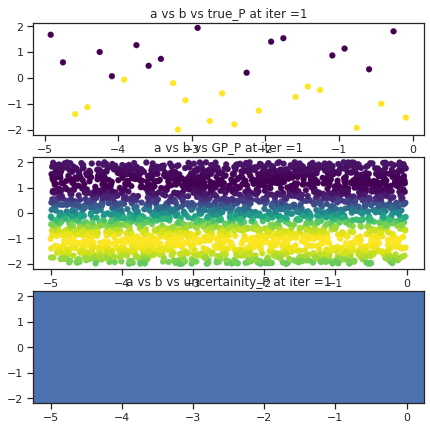

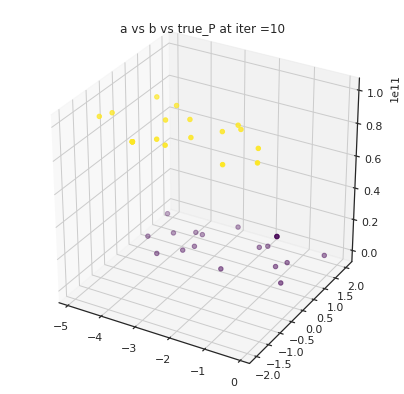

...

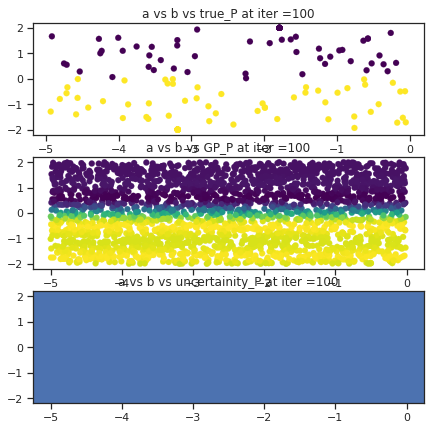

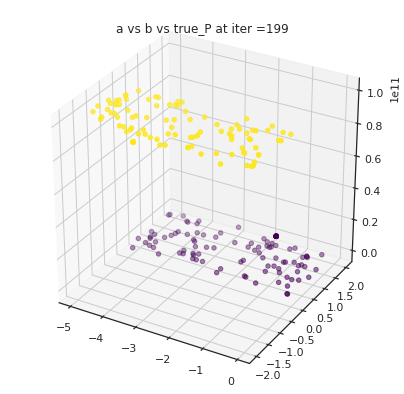

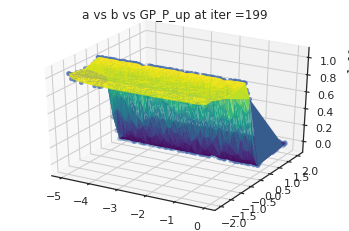

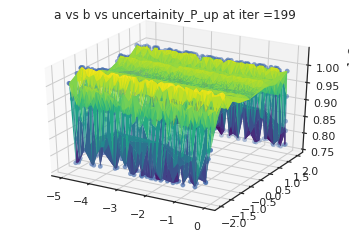

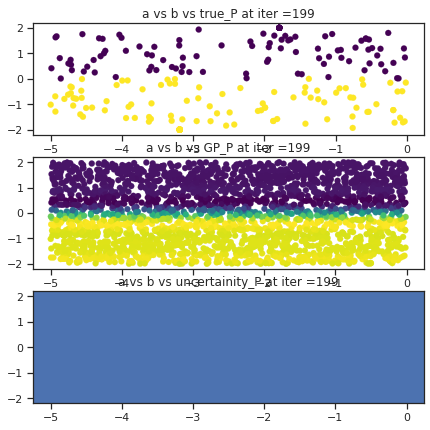

103067890.52833939
766029.9698896306


In [24]:
# Run GP exploration

train_X = to.from_numpy(train_X)
train_Y = to.from_numpy(train_Y)
train_y = to.empty(train_Y.__len__(),1)
train_y[:,0] = train_Y
train_y_fvar = to.empty(train_y.__len__(),1)
train_y_fvar[:,0]=1e-2
test_X = to.from_numpy(x_grid)

# Gp model fit
gp_ferro_toy = SimpleCustomGP(train_X, train_y)
mll = ExactMarginalLogLikelihood(gp_ferro_toy.likelihood, gp_ferro_toy)
fit_gpytorch_model(mll)


for i in range(1, N):
    ## Evaluating the posterior means and variances of the non-sampled lattice sites
    y_pred_toy = gp_ferro_toy.posterior(test_X)
    y_pred_means = y_pred_toy.mean
    y_pred_means = y_pred_means.detach().numpy()
    y_pred_means=np.reshape(y_pred_means,(test_X.__len__(),1))
    y_pred_vars = y_pred_toy.variance
    y_pred_vars = y_pred_vars.detach().numpy()
    y_pred_vars=np.reshape(y_pred_vars,(test_X.__len__(),1))
    acq_cand = np.argmax(y_pred_vars) # Considering only uncertainity from GP -- full exploration
    acq_val = np.max(y_pred_vars)
    ind = acq_cand
    val = acq_val


    if (i==1):
        val_ini = val
#Check for convergence
    if ((val)<=0.0001): # Stop for negligible expected improvement
        print("Model converged due to sufficient reduction of uncertainty over search space ")
        break
    else:
        # Find the true P values of next X, augment to the training dataset
        nextX = to.empty(1, 2)
        next_feval = to.empty(1, 1)
        nextX[0,:] = test_X[ind]

        #Pol = toymod1(x_grid[ind, 0], x_grid[ind, 1], T0, Tc, E)
        Pol = toymod2(a=1, b=x_grid[ind, 0], c=x_grid[ind, 1], T=T0, Tc=Tc, E=E)

        if (Pol.is_real == False):
            Pol = 10e10
        P=np.zeros(1)
        P[0]=Pol
        P = to.from_numpy(P)
        next_feval[:,0] = P
        train_X = to.cat((train_X, nextX),0)
        train_y = to.cat((train_y, next_feval),0)
        train_y_fvar = to.empty(train_y.__len__(), 1)
        train_y_fvar[:, 0] = 1e-2

        # Updating GP model, conditioning on new data
        gp_ferro_toy = SimpleCustomGP(train_X, train_y)
        mll = ExactMarginalLogLikelihood(gp_ferro_toy.likelihood, gp_ferro_toy)
        fit_gpytorch_model(mll)


        if (i==1 or i==10 or i== 30 or i==50 or i==70 or i==100):
            t_x = train_X
            t_x = t_x.detach().numpy()
            #t_x = np.reshape(t_x, (train_X.__len__(), 4))
            t_x = np.reshape(t_x, (train_X.__len__(), 2))
            t_y = train_y
            t_y = t_y.detach().numpy()
            t_y = np.reshape(t_y, (train_X.__len__(), 1))

            plot_exploration_results3D(x_grid, t_x, y_pred_means, t_y, y_pred_vars, i)


P_pred_conv = y_pred_means
P_var_cov = y_pred_vars
# Plots
t_x = train_X
t_x = t_x.detach().numpy()
t_x = np.reshape(t_x, (train_X.__len__(), 2))
t_y = train_y
t_y = t_y.detach().numpy()
t_y = np.reshape(t_y, (train_X.__len__(), 1))

plot_exploration_results3D(x_grid, t_x, P_pred_conv, t_y, y_pred_vars, i)

if (i==N):
    print("Max. sampling reached, model stopped")
print(val)
print(val_ini)

Infeasible domain space a= -1; b= (-5, -0.01); c=(0.01, 2)

In [25]:
#Initializing Paramters
E=0
T0 = 300
Tc = 400 # Curie Temperature
n_grid = 2500
xlimits = np.array([[-5, -0.01], [0.01, 2]])
sampling = LHS(xlimits=xlimits)
np.random.seed(10)
x_grid = sampling(n_grid) # Generating 2500 samples from LHS sampling
num = 30 #Starting samples
N= 200 #Maximum evaluations
np.random.seed(100)
#Initilize with 30 randomly training samples using Latin Hypercube sampling
train_X = sampling(num) 
train_Y = np.zeros(num)

# Find the P values at equilibrium state for the toy models at the starting samples.
# If the P value is no real, the domain is infeasible and the GP will be unstable in this case. To detect such infeasible domain while running the GP, any non-real P values will be tweaked to a very large value.
# This will help us to detect any infeasible domain space with abnormal P values.
# In this example, we considered toy model 1
for i in range(0, num):

    #Pol = toymod1(train_X[i,0], train_X[i,1], T0,Tc, E)
    Pol = toymod2(a=-1, b=train_X[i,0], c=train_X[i,1], T=T0,Tc=Tc, E=E)
    #if (Pol**2<0):
    #    Pol = 10e10
    if (Pol.is_real== False):
         Pol = 10e10
    train_Y[i] = Pol

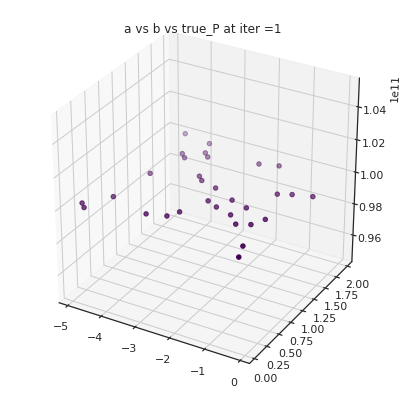

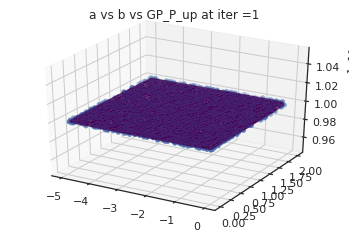

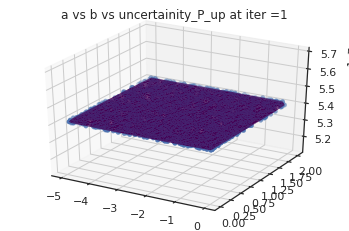

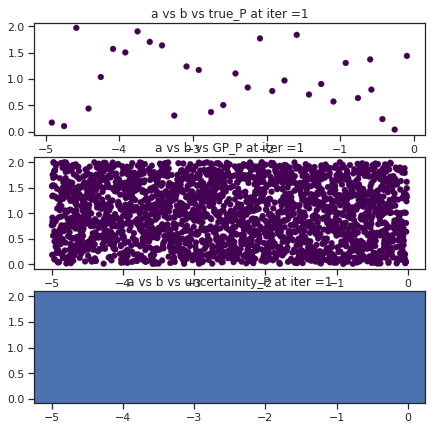

/usr/local/lib/python3.7/dist-packages/gpytorch/distributions/multivariate_normal.py:263: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  NumericalWarning,


Model converged due to sufficient reduction of uncertainty over search space 


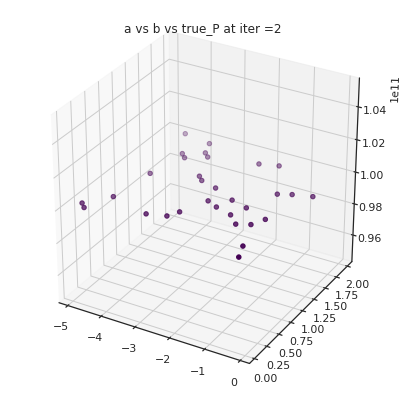

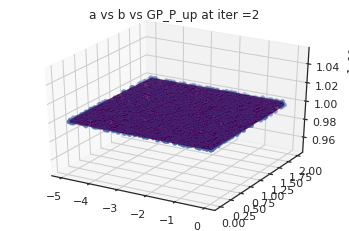

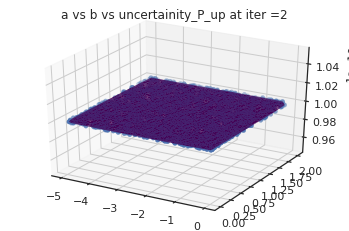

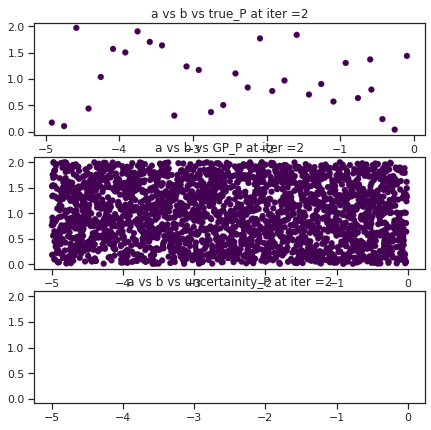

1e-10
54117063.12580109


In [26]:
# Run GP exploration

train_X = to.from_numpy(train_X)
train_Y = to.from_numpy(train_Y)
train_y = to.empty(train_Y.__len__(),1)
train_y[:,0] = train_Y
train_y_fvar = to.empty(train_y.__len__(),1)
train_y_fvar[:,0]=1e-2
test_X = to.from_numpy(x_grid)

# Gp model fit
gp_ferro_toy = SimpleCustomGP(train_X, train_y)
mll = ExactMarginalLogLikelihood(gp_ferro_toy.likelihood, gp_ferro_toy)
fit_gpytorch_model(mll)


for i in range(1, N):
    ## Evaluating the posterior means and variances of the non-sampled lattice sites
    y_pred_toy = gp_ferro_toy.posterior(test_X)
    y_pred_means = y_pred_toy.mean
    y_pred_means = y_pred_means.detach().numpy()
    y_pred_means=np.reshape(y_pred_means,(test_X.__len__(),1))
    y_pred_vars = y_pred_toy.variance
    y_pred_vars = y_pred_vars.detach().numpy()
    y_pred_vars=np.reshape(y_pred_vars,(test_X.__len__(),1))
    acq_cand = np.argmax(y_pred_vars) # Considering only uncertainity from GP -- full exploration
    acq_val = np.max(y_pred_vars)
    ind = acq_cand
    val = acq_val


    if (i==1):
        val_ini = val
#Check for convergence
    if ((val)<=0.0001): # Stop for negligible expected improvement
        print("Model converged due to sufficient reduction of uncertainty over search space ")
        break
    else:
        # Find the true P values of next X, augment to the training dataset
        nextX = to.empty(1, 2)
        next_feval = to.empty(1, 1)
        nextX[0,:] = test_X[ind]

        #Pol = toymod1(x_grid[ind, 0], x_grid[ind, 1], T0, Tc, E)
        Pol = toymod2(a=-1, b=x_grid[ind, 0], c=x_grid[ind, 1], T=T0, Tc=Tc, E=E)

        if (Pol.is_real == False):
            Pol = 10e10
        P=np.zeros(1)
        P[0]=Pol
        P = to.from_numpy(P)
        next_feval[:,0] = P
        train_X = to.cat((train_X, nextX),0)
        train_y = to.cat((train_y, next_feval),0)
        train_y_fvar = to.empty(train_y.__len__(), 1)
        train_y_fvar[:, 0] = 1e-2

        # Updating GP model, conditioning on new data
        gp_ferro_toy = SimpleCustomGP(train_X, train_y)
        mll = ExactMarginalLogLikelihood(gp_ferro_toy.likelihood, gp_ferro_toy)
        fit_gpytorch_model(mll)


        if (i==1 or i==10 or i== 30 or i==50 or i==70 or i==100):
            t_x = train_X
            t_x = t_x.detach().numpy()
            #t_x = np.reshape(t_x, (train_X.__len__(), 4))
            t_x = np.reshape(t_x, (train_X.__len__(), 2))
            t_y = train_y
            t_y = t_y.detach().numpy()
            t_y = np.reshape(t_y, (train_X.__len__(), 1))

            plot_exploration_results3D(x_grid, t_x, y_pred_means, t_y, y_pred_vars, i)


P_pred_conv = y_pred_means
P_var_cov = y_pred_vars
# Plots
t_x = train_X
t_x = t_x.detach().numpy()
t_x = np.reshape(t_x, (train_X.__len__(), 2))
t_y = train_y
t_y = t_y.detach().numpy()
t_y = np.reshape(t_y, (train_X.__len__(), 1))

plot_exploration_results3D(x_grid, t_x, P_pred_conv, t_y, y_pred_vars, i)

if (i==N):
    print("Max. sampling reached, model stopped")
print(val)
print(val_ini)